In [1]:
import os
import numpy as np
from skimage import color, exposure, transform, io
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image

from keras.preprocessing import image 
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.pooling import MaxPooling2D
from keras.optimizers import SGD
from keras import backend as K

/Users/yueyingteng/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [12]:
# parameteres specified for the model

IMG_WI = 224
IMG_HI = 224
NUM_CLASSES = 2



In [2]:

def crop(image_path, coords, saved_location):
    """
    param coords: A tuple of x/y coordinates (x1, y1, x2, y2)
    upper left point and lower right pixel coordinate.
    """
    image_obj = Image.open(image_path)
    size = image_obj.height, image_obj.width
    # rotate and resize to the original image size with height longer than width
    rot = image_obj.rotate( 270, expand = 1).resize(size)

    cropped_image = rot.crop(coords)

    cropped_image.save(saved_location)
#     cropped_image.show()


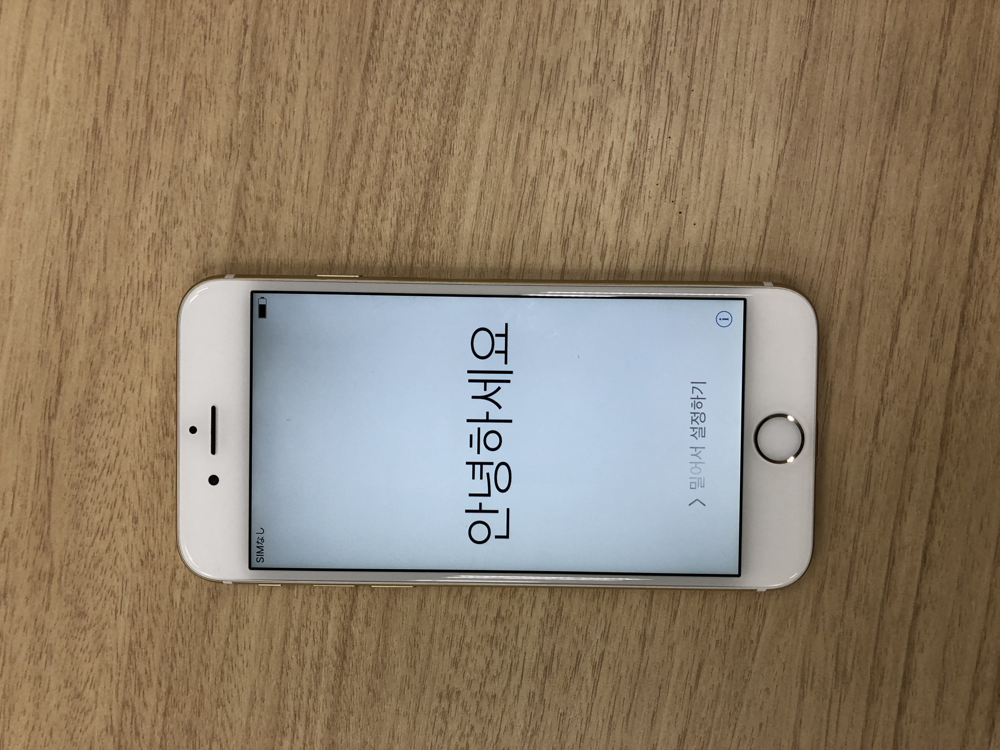

In [3]:
# check if image is rotated 
img_name = 'IMG_0710.JPG'
img_path = '/Users/yueyingteng/Documents/IMG_hello/to_test/full_hello/' + img_name

Image.open(img_path)


In [172]:
# crop the incoming new images

def crop_from_folder(folder):
    # input folder, crop images from this folder
    
    files = os.listdir(folder)
    files = list(map(lambda x: os.path.join(folder, x), files))

    # loop over even if there is only one pic
    for i in range(len(files)):
        try:
            string = files[i]
            match = re.finditer('\/', string)
            to_name = string[list(match)[-1].start() + 1: -4]
            
            # crop images and save to specified location with specified names 
            crop(files[i], (400.0, 1500.0, 2536.0, 2538.0), \
                 '/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/' + to_name + '_Cropped.JPG')

        except OSError:
            continue


In [165]:
# # show the cropped image 

# folder = '/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/'
# files = os.listdir(folder)
# files = list(map(lambda x: os.path.join(folder, x), files))

# # loop over even if there is only one pic
# for i in range(len(files)):
#     try:
#         image_obj = Image.open(files[i])
#         image_obj.show()

#     except OSError:
#         continue

In [4]:
# Histogram normalization in v channel
    
def preprocess_img(img):
    hsv = color.rgb2hsv(img)
    hsv[:, :, 2] = exposure.equalize_hist(hsv[:, :, 2])
    img = color.hsv2rgb(hsv)

    # roll color axis to color channel last style
#     img = np.rollaxis(img, 0, 3)
#     img = np.rollaxis(img, -2)
    
    return img


In [5]:
# resize images to 224 x 224 demean and save to np arrays

def process_toarray(subdir):
    
    folder = '/Users/yueyingteng/Documents/IMG_hello/' + subdir + '/'
    # files are in order due to sorted(os.listdir(folder))
    files = []
    
    for file in sorted(os.listdir(folder)):
        if file in '.DS_Store':
            continue 
        else:
            files.append(os.path.join(folder, file))

            
    img_list = []
    for i, f in enumerate(files):
        try:
            img = image.load_img(f)
            img = img.resize((224, 224)) # keep the full size images
            img = preprocess_img(img)
            
            img = image.img_to_array(img)
            # zero mean center images 
            # img -= np.mean(img)
            
            img_list.append(img)

        except OSError:
            continue

#         if i > 5:
#             break

    img_array = np.asarray(img_list)
    
    # return the name of files in order from sorted(os.listdir(folder))
    return files, img_array


In [6]:
# subtract training data mean from testing data 

def demean(x):
    x_demeaned = np.zeros((x.shape[0], IMG_HI, IMG_HI, 3))
    
    for i in range(x.shape[0]):
        # 0.46870396 is the entire training set mean  
        x_demeaned[i] = x[i] - 0.46870396
    
    return x_demeaned


In [11]:
# preprocess and covnert that new image to np.array

new_files, new_img = process_toarray('Demo_img_cropped')
# training data mean subtractin  
new_img = demean(new_img)

# training image mean 0.46870396
# new_hello = process_toarray('./to_test/hello')
# new_no_hello = process_toarray('./to_test/no_hello')

# # training data mean subtraction 
# new_hello = demean(new_hello)
# new_no_hello = demean(new_no_hello)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


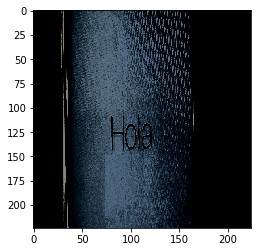

In [13]:
plt.imshow(new_img[0])


In [9]:
# create the model and load the model weights 

def cnn_model():
    model = Sequential()
    
    # zero padding
    model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (IMG_HI, IMG_WI, 3), activation = 'relu'))
    model.add(Conv2D(32, (3, 3), activation = 'relu'))
    model.add(MaxPooling2D(pool_size = (2, 2)))
    model.add(Dropout(0.2))

    model.add(Conv2D(64, (3, 3), padding = 'same', activation = 'relu'))
    model.add(Conv2D(64, (3, 3), activation = 'relu'))
    model.add(MaxPooling2D(pool_size = (2, 2)))
    model.add(Dropout(0.2))

    model.add(Conv2D(128, (3, 3), padding = 'same', activation = 'relu'))
    model.add(Conv2D(128, (3, 3), activation = 'relu'))
    model.add(MaxPooling2D(pool_size = (2, 2)))
    model.add(Dropout(0.2))

    model.add(Flatten())
    model.add(Dense(512, activation = 'relu'))
    model.add(Dropout(0.5))
    model.add(Dense(NUM_CLASSES, activation = 'softmax'))
    
    return model


In [10]:

model = cnn_model()
# ./saved_models/30_epochs_model.h5 
# ./saved_models/model.h5
# ./saved_models/corrected_30_epochs.h5

# model.load_weights('./model.h5')
model.load_weights('./saved_models/corrected_30_epochs.h5')

model.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 222, 222, 32)      9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 111, 111, 64)      18496     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 109, 109, 64)      36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 54, 54, 64)        0         
__________

In [18]:
# print (model.layers[0])

# weights = model.layers[0].get_weights()[0]
# bias = model.layers[0].get_weights()[1]

In [14]:
# index and prediction results
# zero is hello one is no_hello

np.asarray((new_files, np.argmax(model.predict(new_img), axis = 1))).T



array([['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0733_Cropped.JPG',
        '0'],
       ['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0734_Cropped.JPG',
        '1'],
       ['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0735_Cropped.JPG',
        '0'],
       ['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0736_Cropped.JPG',
        '0'],
       ['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0737_Cropped.JPG',
        '0']], dtype='<U76')

In [181]:
# main 

folder = '/Users/yueyingteng/Documents/IMG_hello/Demo_img/'

# def demo(folder):
# input folder is where the demo pictures live, crop function is also applied on those pictures 
# crop new testing images 
crop_from_folder(folder)

new_files, new_img = process_toarray('Demo_img_cropped')
# training data mean subtraction from the new testing images 
new_img = demean(new_img)

# prediction - zero is hello, one is no_hello
print(np.asarray((new_files, np.argmax(model.predict(new_img), axis = 1))).T)



[['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0733_Cropped.JPG'
  '0']
 ['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0734_Cropped.JPG'
  '1']
 ['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0735_Cropped.JPG'
  '0']
 ['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0736_Cropped.JPG'
  '0']
 ['/Users/yueyingteng/Documents/IMG_hello/Demo_img_cropped/IMG_0737_Cropped.JPG'
  '0']]


### test on 25 pictures for each class 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(224, 224, 3)


1.0

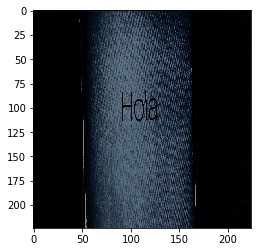

In [111]:
# make prediction - hello is zero, no_hello is ONE

# hello
plt.imshow(new_hello[0])
print (new_hello[0].shape)

pred_hello = np.argmax(model.predict(new_hello), axis = 1)
# create one hot encoded labels 
label_hello = [0] * new_hello.shape[0]
truth_hello = np.argmax(np.eye(2)[label_hello], axis = 1)

sum(truth_hello == pred_hello)/new_hello.shape[0]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(224, 224, 3)


0.875

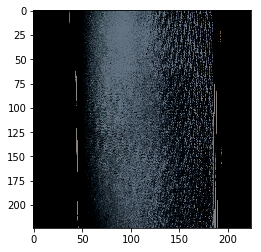

In [99]:
# make prediction - hello is zero, no_hello is ONE

# no_hello

plt.imshow(new_no_hello[0])
print (new_no_hello[0].shape)

pred_no_hello = np.argmax(model.predict(new_no_hello), axis = 1)
# create one hot encoded labels 
label_no_hello = [1] * new_no_hello.shape[0]
truth_no_hello = np.argmax(np.eye(2)[label_no_hello], axis = 1)

sum(truth_no_hello == pred_no_hello)/new_no_hello.shape[0]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


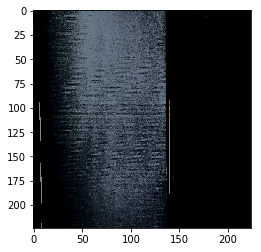

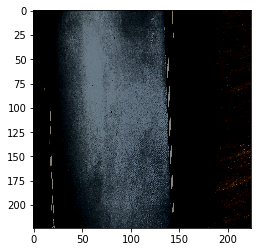

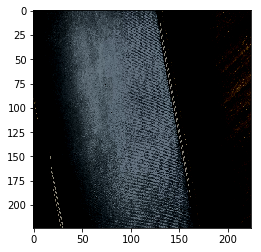

In [169]:
# get wronlgy classified images and print them out 

for i in np.where(pred_no_hello != truth_no_hello)[0]:
    plt.figure()
    plt.imshow(new_no_hello[i])